<a href="https://www.kaggle.com/c/quora-question-pairs"><img src="aaic_title.jpg"></a>

#### imorting libraries

In [140]:
import numpy as np # for numerical operation
import pandas as pd # for data preprocessing
import seaborn as sns # for data visualization
import matplotlib.pyplot as plt # for data visualization
%matplotlib inline 
# plotting inline(adjusting automatically)

from subprocess import check_output # (no need to install subprocess)

import plotly.offline as py # for better visualization
py.init_notebook_mode(connected=True) # initializing plotly for offline use in notebook mode

import plotly.graph_objs as go
import plotly.tools as tls
import os
import gc

import re # for handling regular expression

from nltk.corpus import stopwords # if occuring error, donwload stopowords first
import distance 

from nltk.stem import PorterStemmer # for stemming the words (Stemming is not always better)
from bs4 import BeautifulSoup # for web-scraping and handling html related problem

In [141]:
import warnings
warnings.filterwarnings('ignore')

from fuzzywuzzy import fuzz
from sklearn.manifold import TSNE

# for visualization of text share in perticular class
from wordcloud import WordCloud, STOPWORDS
from os import path
from PIL import Image

In [142]:
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

# importing ML algorithms
from sklearn.neighbors import KNeighborsClassifier 
# we are not gonna use KNN because of large runtime complexity
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import SGDClassifier
from sklearn.linear_model import LogisticRegression
#       Calibrated Classifier
from sklearn.calibration import CalibratedClassifierCV
#       mlxtend Stacking Classifier
from mlxtend.classifier import StackingClassifier
#       Ensembling method
from sklearn.ensemble import RandomForestClassifier

################################################
## MODEL SELECTION #############################
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score

# METRICS
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import log_loss
from sklearn.metrics import normalized_mutual_info_score
from sklearn.metrics import auc, roc_curve, precision_recall_curve


from tqdm import tqdm # for tracking the iterative processing
import spacy # NLP library
from scipy.sparse import hstack

import time
import sqlite3
from sqlalchemy import create_engine
import csv

from collections import Counter, defaultdict



<hr>

#### Reading data and basic stats

In [143]:
df = pd.read_csv('train.csv')

In [144]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404290 entries, 0 to 404289
Data columns (total 6 columns):
id              404290 non-null int64
qid1            404290 non-null int64
qid2            404290 non-null int64
question1       404289 non-null object
question2       404288 non-null object
is_duplicate    404290 non-null int64
dtypes: int64(4), object(2)
memory usage: 18.5+ MB


In [145]:
df.describe()

,id,qid1,qid2,is_duplicate
count,404290.000000,404290.000000,404290.000000,404290.000000
mean,202144.500000,217243.942418,220955.655337,0.369198
std,116708.614502,157751.700002,159903.182629,0.482588
min,0.000000,1.000000,2.000000,0.000000
25%,101072.250000,74437.500000,74727.000000,0.000000
50%,202144.500000,192182.000000,197052.000000,0.000000
75%,303216.750000,346573.500000,354692.500000,1.000000
max,404289.000000,537932.000000,537933.000000,1.000000


In [146]:
df.head()

,id,qid1,qid2,question1,question2,is_duplicate
0,0,1,2,What is the step by step guide to invest in sh...,What is the step by step guide to invest in sh...,0
1,1,3,4,What is the story of Kohinoor (Koh-i-Noor) Dia...,What would happen if the Indian government sto...,0
2,2,5,6,How can I increase the speed of my internet co...,How can Internet speed be increased by hacking...,0
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
4,4,9,10,"Which one dissolve in water quikly sugar, salt...",Which fish would survive in salt water?,0


In [147]:
df.tail()

,id,qid1,qid2,question1,question2,is_duplicate
404285,404285,433578,379845,How many keywords are there in the Racket prog...,How many keywords are there in PERL Programmin...,0
404286,404286,18840,155606,Do you believe there is life after death?,Is it true that there is life after death?,1
404287,404287,537928,537929,What is one coin?,What's this coin?,0
404288,404288,537930,537931,What is the approx annual cost of living while...,I am having little hairfall problem but I want...,0
404289,404289,537932,537933,What is like to have sex with cousin?,What is it like to have sex with your cousin?,0


<hr>

#### Distribution of data points among output classes

- Number of duplicate(similar) and non-duplicate(non-similar) questions

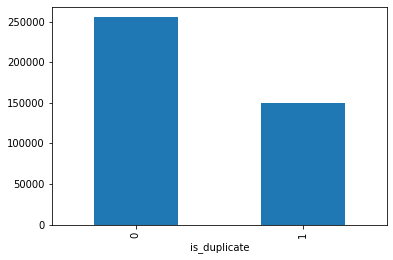

In [148]:
df.groupby('is_duplicate')['id'].count().plot.bar()

In [149]:
print("Question pairs are not Similar(is_duplicate=0):", 100-df['is_duplicate'].mean()*100,"%")
print("="*100)
print("Question pairs are Similar(is_duplicate=1):", df['is_duplicate'].mean()*100,"%")

Question pairs are not Similar(is_duplicate=0): 63.0802146973707 %
Question pairs are Similar(is_duplicate=1): 36.9197853026293 %


In [150]:
qids = pd.Series(df['qid1'].tolist() + df['qid2'].tolist())
unique_qs = len(np.unique(qids))
qs_morethan_onetime = np.sum(qids.value_counts() > 1)
print ('Total number of  Unique Questions are: {}\n'.format(unique_qs))
#print len(np.unique(qids))

print ('Number of unique questions that appear more than one time: {} ({}%)\n'.format(qs_morethan_onetime,qs_morethan_onetime/unique_qs*100))

print ('Max number of times a single question is repeated: {}\n'.format(max(qids.value_counts()))) 

q_vals=qids.value_counts()

q_vals=q_vals.values

Total number of  Unique Questions are: 537933

Number of unique questions that appear more than one time: 111780 (20.77953945937505%)

Max number of times a single question is repeated: 157



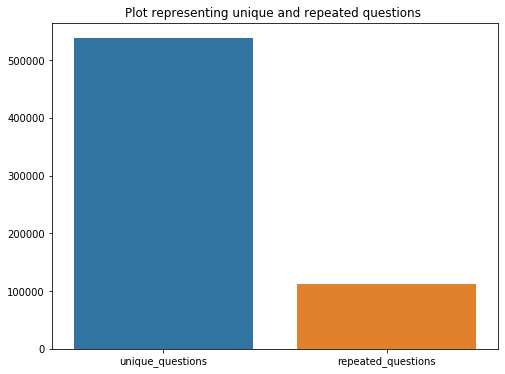

In [151]:
%matplotlib inline
x = ['unique_questions', 'repeated_questions']
y = [unique_qs, qs_morethan_onetime]

plt.figure(figsize=(8,6))
plt.title("Plot representing unique and repeated questions ")
sns.barplot(x,y)
plt.show()

<hr>

#### Checking for duplicates:
- Checking whether there are any repeated pair of questions

In [152]:
pair_duplicates = df[['qid1','qid2','is_duplicate']].groupby(['qid1','qid2']).count().reset_index()

In [153]:
pair_duplicates.shape

(404290, 3)

In [154]:
df.shape

(404290, 6)

In [155]:
result = pair_duplicates.shape[0] - df.shape[0]

if result==0:
    print("There is no repeated pair of questions")
else:
    print("There is a few repeated pair of questions, please check it out!")

There is no repeated pair of questions


<hr>

#### Number of occurences of each question

Maximum number of times a single question is repeated: 157



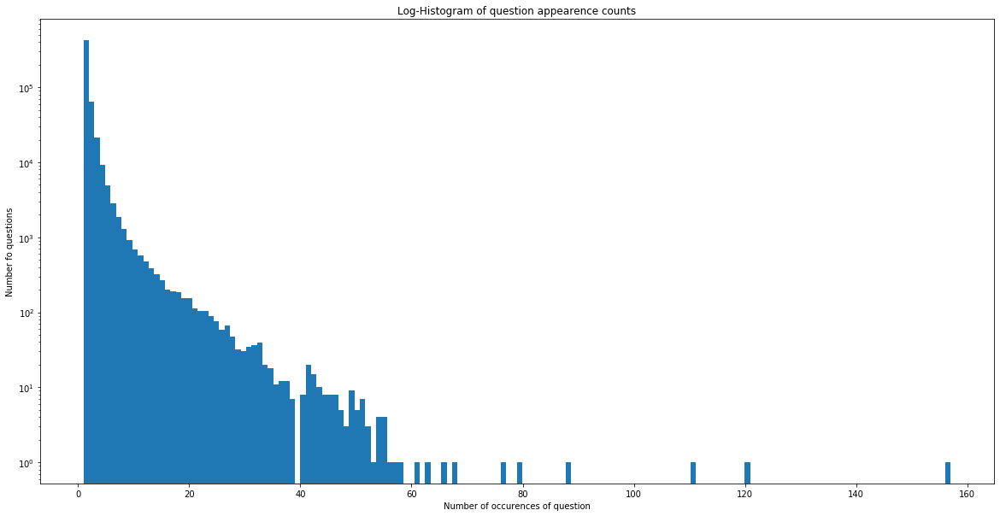

In [156]:
plt.figure(figsize=(20,10))

plt.hist(qids.value_counts(), bins=160)

plt.yscale('log',nonposy='clip')

plt.title('Log-Histogram of question appearence counts')

plt.xlabel('Number of occurences of question')

plt.ylabel('Number fo questions')

print('Maximum number of times a single question is repeated: {}\n'.format(max(qids.value_counts())))

<hr>

#### Checking for NULL Values

In [157]:
# Checkign whether any rows containing NULL values or not
nan_rows = df[df.isnull().any(1)]
print(nan_rows)

            id    qid1    qid2                         question1  \
105780  105780  174363  174364    How can I develop android app?   
201841  201841  303951  174364  How can I create an Android app?   
363362  363362  493340  493341                               NaN   

                                                question2  is_duplicate  
105780                                                NaN             0  
201841                                                NaN             0  
363362  My Chinese name is Haichao Yu. What English na...             0  


In [158]:
# Filling the null values with ' '
df = df.fillna('')
nan_rows = df[df.isnull().any(1)]
print(nan_rows)

Empty DataFrame
Columns: [id, qid1, qid2, question1, question2, is_duplicate]
Index: []


<hr>

<p style="font-family:'Segoe UI';font-size:20px;color:red">Before doing Feature Extraction we nee to split our data into train and test dataset.</p>

In [159]:
train_df = df.sample(frac=0.7,random_state=42)

In [160]:
print("Question pairs are not Similar(is_duplicate=0):", 100-train_df['is_duplicate'].mean()*100,"%")
print("="*100)
print("Question pairs are Similar(is_duplicate=1):", train_df['is_duplicate'].mean()*100,"%")

Question pairs are not Similar(is_duplicate=0): 63.03325406444454 %
Question pairs are Similar(is_duplicate=1): 36.96674593555546 %


In [161]:
len(train_df)

283003

In [162]:
test_df = df.drop(train_df.index)

In [163]:
print("Question pairs are not Similar(is_duplicate=0):", 100-train_df['is_duplicate'].mean()*100,"%")
print("="*100)
print("Question pairs are Similar(is_duplicate=1):", train_df['is_duplicate'].mean()*100,"%")

Question pairs are not Similar(is_duplicate=0): 63.03325406444454 %
Question pairs are Similar(is_duplicate=1): 36.96674593555546 %


In [164]:
len(test_df)

121287

In [165]:
# header of train_df
train_df.head(1)

,id,qid1,qid2,question1,question2,is_duplicate
8067,8067,15738,15739,How do I play Pokémon GO in Korea?,How do I play Pokémon GO in China?,0


In [166]:
# header of test_df
test_df.head()

,id,qid1,qid2,question1,question2,is_duplicate
3,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0
5,5,11,12,Astrology: I am a Capricorn Sun Cap moon and c...,"I'm a triple Capricorn (Sun, Moon and ascendan...",1
13,13,27,28,What was your first sexual experience like?,What was your first sexual experience?,1
14,14,29,30,What are the laws to change your status from a...,What are the laws to change your status from a...,0
15,15,31,32,What would a Trump presidency mean for current...,How will a Trump presidency affect the student...,1


<hr>

**Saving 'train_df.csv' & 'test_df.csv'**

In [167]:
train_df.to_csv('train_df.csv', index=False)
test_df.to_csv('test_df.csv', index=False)

## 3.3 Basic Feature Extraction

Let us now construct a few features like:
 - ____freq_qid1____ = Frequency of qid1's
 - ____freq_qid2____ = Frequency of qid2's 
 - ____q1len____ = Length of q1
 - ____q2len____ = Length of q2
 - ____q1_n_words____ = Number of words in Question 1
 - ____q2_n_words____ = Number of words in Question 2
 - ____word_Common____ = (Number of common unique words in Question 1 and Question 2)
 - ____word_Total____ =(Total num of words in Question 1 + Total num of words in Question 2)
 - ____word_share____ = (word_common)/(word_Total)
 - ____freq_q1+freq_q2____ = sum total of frequency of qid1 and qid2 
 - ____freq_q1-freq_q2____ = absolute difference of frequency of qid1 and qid2 

### Basic feature extraction for Train dataset

In [168]:
train_df['question1'] = train_df['question1'].apply(lambda x: str(x))
train_df['question2'] = train_df['question2'].apply(lambda x: str(x))

In [169]:
test_df['question1'] = test_df['question1'].apply(lambda x: str(x))
test_df['question2'] = test_df['question2'].apply(lambda x: str(x))

In [174]:
if os.path.isfile('df_fe_without_preprocessing_train_data.csv'):
    train_df = pd.read_csv('df_fe_without_preprocessing_train_data.csv',encoding='latin-1')
else:
    train_df['freq_qid1'] = train_df.groupby('qid1')['qid1'].transform('count')
    train_df['freq_qid2'] = train_df.groupby('qid2')['qid2'].transform('count')
    train_df['q1len'] = train_df['question1'].str.len()
    train_df['q2len'] = train_df['question2'].str.len()
    train_df['q1_n_words'] = train_df['question1'].apply(lambda row: len(row.split(" ")))
    train_df['q2_n_words'] = train_df['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0 * len(w1 & w2)
    train_df['word_Common'] = train_df.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0* (len(w1) + len(w2))
    train_df['word_share'] = train_df.apply(normalized_word_Total,axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0* len(w1 & w2)/ (len(w1) + len(w2))
    train_df['word_share'] = train_df.apply(normalized_word_share, axis=1)

    train_df['freq_q1+q2'] = train_df['freq_qid1'] + train_df['freq_qid2']
    train_df['freq_q1-q2'] = abs(train_df['freq_qid1'] - train_df['freq_qid2'])

    train_df.to_csv('df_fe_without_preprocessing_train_data.csv', index=False)

train_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,8067,15738,15739,How do I play PokÃÂ©mon GO in Korea?,How do I play PokÃÂ©mon GO in China?,0,2,2,35,35,8,8,7.0,0.437500,4,0
1,368101,12736,104117,What are some of the best side dishes for crab...,What are some good side dishes for buffalo chi...,0,5,1,53,51,11,9,6.0,0.300000,6,4
2,70497,121486,121487,Which is more advisable and better material fo...,What is the best server setup for buddypress?,0,1,1,96,45,16,8,2.0,0.083333,2,0
3,226567,254474,258192,How do I improve logical programming skills?,How can I improve my logical skills for progra...,1,2,2,44,52,7,9,4.0,0.250000,4,0
4,73186,48103,3062,How close we are to see 3rd world war?,How close is a World War III?,1,3,21,38,29,9,7,3.0,0.187500,24,18


### basic feature extraction for test dataset

In [175]:
if os.path.isfile('df_fe_without_preprocessing_test_data.csv'):
    test_df = pd.read_csv('df_fe_without_preprocessing_test_data.csv',encoding='latin-1')
else:
    test_df['freq_qid1'] = test_df.groupby('qid1')['qid1'].transform('count')
    test_df['freq_qid2'] = test_df.groupby('qid2')['qid2'].transform('count')
    test_df['q1len'] = test_df['question1'].str.len()
    test_df['q2len'] = test_df['question2'].str.len()
    test_df['q1_n_words'] = test_df['question1'].apply(lambda row: len(row.split(" ")))
    test_df['q2_n_words'] = test_df['question2'].apply(lambda row: len(row.split(" ")))

    def normalized_word_Common(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0 * len(w1 & w2)
    test_df['word_Common'] = test_df.apply(normalized_word_Common, axis=1)

    def normalized_word_Total(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0* (len(w1) + len(w2))
    test_df['word_share'] = test_df.apply(normalized_word_Total,axis=1)

    def normalized_word_share(row):
        w1 = set(map(lambda word: word.lower().strip(), row['question1'].split(" ")))
        w2 = set(map(lambda word: word.lower().strip(), row['question2'].split(" ")))
        return 1.0* len(w1 & w2)/ (len(w1) + len(w2))
    test_df['word_share'] = test_df.apply(normalized_word_share, axis=1)

    test_df['freq_q1+q2'] = test_df['freq_qid1'] + test_df['freq_qid2']
    test_df['freq_q1-q2'] = abs(test_df['freq_qid1'] - test_df['freq_qid2'])

    test_df.to_csv('df_fe_without_preprocessing_test_data.csv', index=False)

test_df.head()

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,0.000000,2,0
1,5,11,12,Astrology: I am a Capricorn Sun Cap moon and c...,"I'm a triple Capricorn (Sun, Moon and ascendan...",1,1,1,86,90,16,16,8.0,0.258065,2,0
2,13,27,28,What was your first sexual experience like?,What was your first sexual experience?,1,1,2,43,38,7,6,5.0,0.384615,3,1
3,14,29,30,What are the laws to change your status from a...,What are the laws to change your status from a...,0,2,3,141,140,29,29,20.0,0.454545,5,1
4,15,31,32,What would a Trump presidency mean for current...,How will a Trump presidency affect the student...,1,1,5,93,91,15,17,4.0,0.129032,6,4


<hr>

#### Analysis of some extracted features for Train_df.
- Here are some questions have only one single words.

In [176]:
print("="*10, " Train_df ","="*10)
print("="*50)
print('Minimum length of the questions in question1 : ',min(train_df['q1_n_words']))

print('Minimum length of the questions in question2 : ',min(train_df['q2_n_words']))

print('Number of Questions with minimum length [question1] : ', train_df[train_df['q1_n_words'] ==1].shape[0])
print('Number of Questions with minimum length [question2] : ', train_df[train_df['q2_n_words'] ==1].shape[0])

==========  Train_df  ==========
Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] :  48
Number of Questions with minimum length [question2] :  16


<hr>

#### Analysis of some extracted features for Test_df.
- Here are some questions have only one single words.

In [177]:
print("="*10, " Test_df ","="*10)
print("="*50)
print('Minimum length of the questions in question1 : ',min(test_df['q1_n_words']))

print('Minimum length of the questions in question2 : ',min(test_df['q2_n_words']))

print('Number of Questions with minimum length [question1] : ', test_df[test_df['q1_n_words'] ==1].shape[0])
print('Number of Questions with minimum length [question2] : ', test_df[test_df['q2_n_words'] ==1].shape[0])

==========  Test_df  ==========
Minimum length of the questions in question1 :  1
Minimum length of the questions in question2 :  1
Number of Questions with minimum length [question1] :  19
Number of Questions with minimum length [question2] :  8


<hr>

#### 3.3.1.1 Feature: word_share for Train_df

In [178]:
train_df[train_df['is_duplicate'] ==1.0]['word_share'][0:]

3         0.250000
4         0.187500
5         0.437500
8         0.071429
9         0.111111
            ...   
282995    0.200000
282996    0.428571
282997    0.425926
282998    0.333333
283002    0.333333
Name: word_share, Length: 104617, dtype: float64

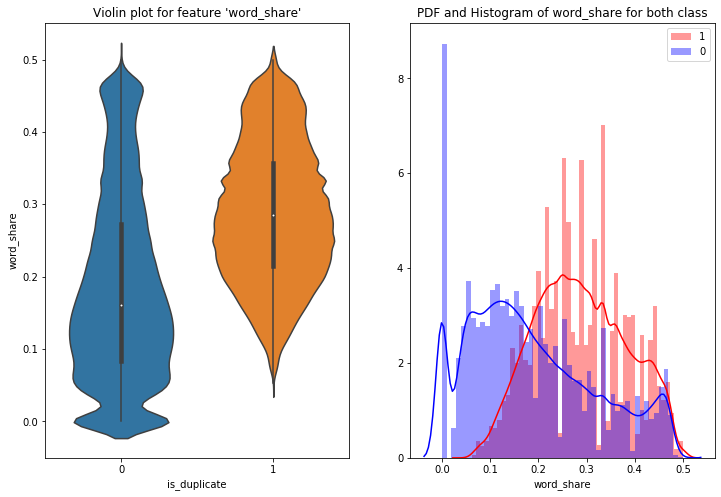

In [179]:
plt.figure(figsize=(12,8))

plt.subplot(1,2,1)
sns.violinplot(x ='is_duplicate', y='word_share', data=train_df[0:])
plt.title("Violin plot for feature 'word_share'")

plt.subplot(1,2,2)
sns.distplot(train_df[train_df['is_duplicate'] ==1.0]['word_share'][0:], label= '1', color='red')
sns.distplot(train_df[train_df['is_duplicate'] ==0.0]['word_share'][0:], label= '0', color='blue')
plt.title("PDF and Histogram of word_share for both class")
plt.legend()
plt.show()

#### 3.3.1.2 Feature: word_share for Test_df

In [180]:
test_df[test_df['is_duplicate']== 1.0]['word_share']

1         0.258065
2         0.384615
4         0.129032
5         0.192308
10        0.379310
            ...   
121276    0.380952
121279    0.133333
121280    0.350000
121284    0.230769
121286    0.428571
Name: word_share, Length: 44646, dtype: float64

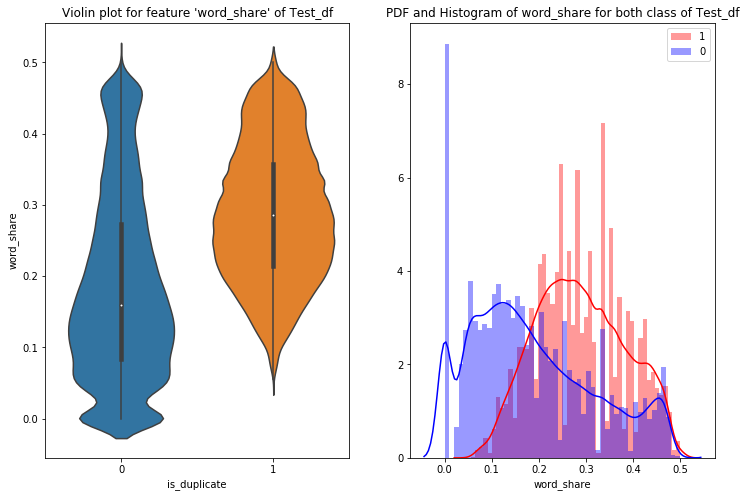

In [181]:
plt.figure(figsize=(12,8))

plt.subplot(1,2,1)
sns.violinplot(x ='is_duplicate', y='word_share', data=test_df[0:])
plt.title("Violin plot for feature 'word_share' of Test_df")

plt.subplot(1,2,2)
sns.distplot(test_df[test_df['is_duplicate'] ==1.0]['word_share'][0:], label= '1', color='red')
sns.distplot(test_df[test_df['is_duplicate'] ==0.0]['word_share'][0:], label= '0', color='blue')
plt.title("PDF and Histogram of word_share for both class of Test_df")
plt.legend()
plt.show()

**For both train_df and test_df**

- The distributions for normalized word_share have some overlap on the far right-hand side, i.e., there are quite a lot of questions with high word similarity.
- The average word share and Common no.of words of qid1 and qid2 is more when they are duplicate(Similar)

#### 3.3.2.1 Feature: word_Common of train_df

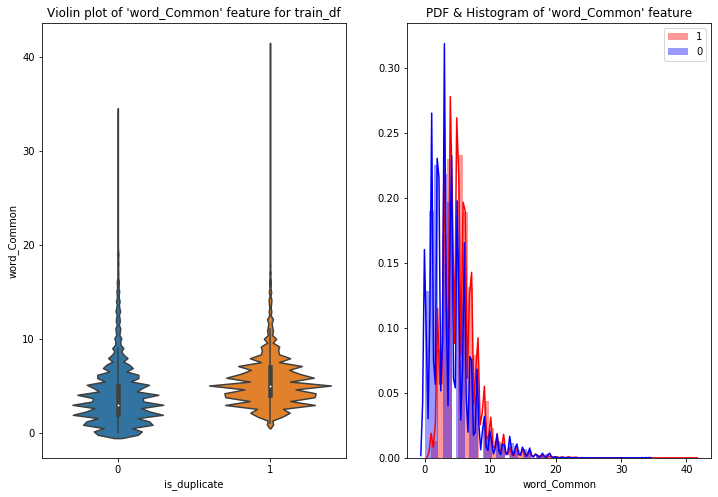

In [182]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x='is_duplicate', y='word_Common', data = train_df[0:])
plt.title("Violin plot of 'word_Common' feature for train_df")

plt.subplot(1,2,2)
sns.distplot(train_df[train_df['is_duplicate'] ==1.0]['word_Common'][0:], label='1', color='red')
sns.distplot(train_df[train_df['is_duplicate'] ==0.0]['word_Common'][0:], label='0', color='blue')
plt.title("PDF & Histogram of 'word_Common' feature")
plt.legend()
plt.show()

#### 3.3.2.2 Feature: word_Common of test_df

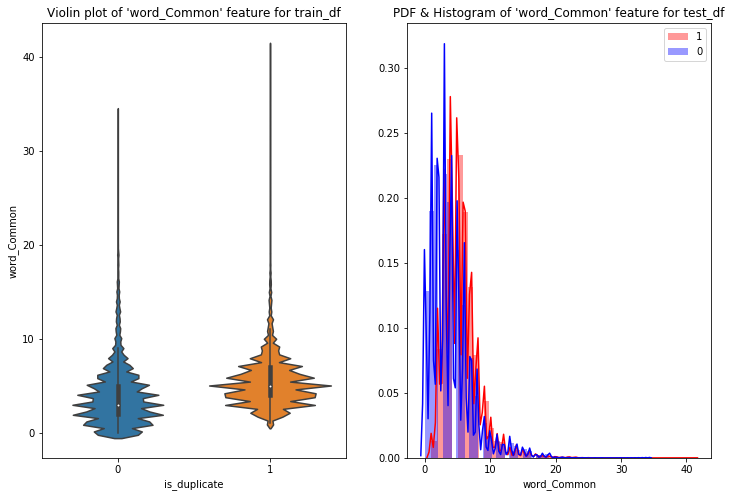

In [183]:
plt.figure(figsize=(12, 8))

plt.subplot(1,2,1)
sns.violinplot(x='is_duplicate', y='word_Common', data = train_df[0:])
plt.title("Violin plot of 'word_Common' feature for train_df")

plt.subplot(1,2,2)
sns.distplot(train_df[train_df['is_duplicate'] ==1.0]['word_Common'][0:], label='1', color='red')
sns.distplot(train_df[train_df['is_duplicate'] ==0.0]['word_Common'][0:], label='0', color='blue')
plt.title("PDF & Histogram of 'word_Common' feature for test_df")
plt.legend()
plt.show()

<hr>
<hr>
<p style="font-family:'Segoe UI';font-size:20px;color:red">from now, below is completely isolated process</p>
<hr>
<hr>

## 1.2.1 EDA: Advanced Feature Extraction.

In [184]:
# train dataset
if os.path.isfile('df_fe_without_preprocessing_train_data.csv'):
    train_df = pd.read_csv("df_fe_without_preprocessing_train_data.csv",encoding='latin-1')
    train_df = train_df.fillna('')
    train_df.head()
else:
    print("get df_fe_without_prerpocessing_train_data.csv from drive or run the previous notebook")

In [185]:
# test dataset
if os.path.isfile('df_fe_without_preprocessing_test_data.csv'):
    test_df = pd.read_csv("df_fe_without_preprocessing_test_data.csv",encoding='latin-1')
    test_df = test_df.fillna('')
    test_df.head()
else:
    print("get df_fe_without_prerpocessing_test_data.csv from drive or run the previous notebook")

In [188]:
train_df.head(1)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,8067,15738,15739,How do I play PokÃÂ©mon GO in Korea?,How do I play PokÃÂ©mon GO in China?,0,2,2,35,35,8,8,7.0,0.4375,4,0


In [189]:
test_df.head(1)

,id,qid1,qid2,question1,question2,is_duplicate,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,1,1,50,65,11,9,0.0,0.0,2,0


## 3.4 Preprocessing of Text

- Preprocessing:
    - Removing html tags
    - Removing Punctuations
    - Performing Stemming (*Stemming doesn't work well for this problem, ref: observed by trial & error*)
    - Removing Stopwords
    - Expanding contractions etc.
    
    

In [190]:
# To get the result in 4 decimal points
SAFE_DIV = 0.0001

STOP_WORDS = stopwords.words('english')

def preprocess(x):
    x = str(x).lower()
    x = x.replace(",000,000", "m").replace(",000", "k").replace("′", "'").replace("’", "'")\
                           .replace("won't", "will not").replace("cannot", "can not").replace("can't", "can not")\
                           .replace("n't", " not").replace("what's", "what is").replace("it's", "it is")\
                           .replace("'ve", " have").replace("i'm", "i am").replace("'re", " are")\
                           .replace("he's", "he is").replace("she's", "she is").replace("'s", " own")\
                           .replace("%", " percent ").replace("₹", " rupee ").replace("$", " dollar ")\
                           .replace("€", " euro ").replace("'ll", " will")
    
    # substitution
    x = re.sub(r"([0-9]+)000000", r"\1m", x)
    x = re.sub(r"([0-9]+)000", r"\1k", x)
    
    
    # https://nlpforhackers.io/stemmers-vs-lemmatizers/
    # Stemming
    
    porter = PorterStemmer()
    # here, instead of Lemmatier we will use Stemmer
    
    pattern = re.compile('\W')
    
    if type(x) == type(''):
        x = porter.stem(x)
        example1 = BeautifulSoup(x)
        x = example1.get_text()
    
    if type(x) == type(''):
        x = re.sub(pattern, ' ',x)
    
    return x

In [191]:
# # FOR TESTING PURPOSE 
###################################################
# ######## Uncomment below code to see the flow ###
###################################################
# temp = '''This is md iqbal <b>spended</b> 1000₹. HOw are you doing? I'm not the only intelligent personality here, right. please go slowly'''

# # converting into lowercase
# temp = str(temp).lower()
# print("after lowercase : ",temp)
# print("="*30)

# # substitute 1000 to 1k
# temp = re.sub(r"([0-9]+)000", r"\1k", temp)
# print("after substitute : ",temp)
# print('='*30)

# # replace '₹' by 'rupee'
# temp = temp.replace('₹','rupee')
# print("after replacing : ",temp)
# print("="*30)

# from nltk.stem import PorterStemmer
# porter = PorterStemmer()
# pattern = re.compile('\W')

# if type(temp) == type(''):
#     temp = porter.stem(temp)
#     print('After stem:',temp)
#     print("="*20)
#     example=BeautifulSoup(temp)
#     print('Example is:',example)
#     print("="*20)
#     temp = example.get_text()
#     print('now temp is: ',temp)

## 3.5 Advanced Feature Extraction (NLP and Fuzzy Features)

Definition:

    -__Token__: You get a token by splitting sentence by a space.
    -__Stop_Word__: stop words as per NLTK.
    -__Word__: A token that is not a stop_word.
    
Features:
- __cwc_min__ :  Ratio of common_word_count to min lenghth of word count of Q1 and Q2 <br>cwc_min = common_word_count / (min(len(q1_words), len(q2_words))
<br>
<br>
- __cwc_max__ :  Ratio of common_word_count to max lenghth of word count of Q1 and Q2 <br>cwc_max = common_word_count / (max(len(q1_words), len(q2_words))
<br>
<br>
- __csc_min__ :  Ratio of common_stop_count to min lenghth of stop count of Q1 and Q2 <br> csc_min = common_stop_count / (min(len(q1_stops), len(q2_stops))
<br>
<br>
- __csc_max__ :  Ratio of common_stop_count to max lenghth of stop count of Q1 and Q2<br>csc_max = common_stop_count / (max(len(q1_stops), len(q2_stops))
<br>
<br>
- __ctc_min__ :  Ratio of common_token_count to min lenghth of token count of Q1 and Q2<br>ctc_min = common_token_count / (min(len(q1_tokens), len(q2_tokens))
<br>
<br>

- __ctc_max__ :  Ratio of common_token_count to max lenghth of token count of Q1 and Q2<br>ctc_max = common_token_count / (max(len(q1_tokens), len(q2_tokens))
<br>
<br>
        
- __last_word_eq__ :  Check if First word of both questions is equal or not<br>last_word_eq = int(q1_tokens[-1] == q2_tokens[-1])
<br>
<br>

- __first_word_eq__ :  Check if First word of both questions is equal or not<br>first_word_eq = int(q1_tokens[0] == q2_tokens[0])
<br>
<br>
        
- __abs_len_diff__ :  Abs. length difference<br>abs_len_diff = abs(len(q1_tokens) - len(q2_tokens))
<br>
<br>

- __mean_len__ :  Average Token Length of both Questions<br>mean_len = (len(q1_tokens) + len(q2_tokens))/2
<br>
<br>


- __fuzz_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>

- __fuzz_partial_ratio__ :  https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_sort_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>


- __token_set_ratio__ : https://github.com/seatgeek/fuzzywuzzy#usage
http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
<br>
<br>





- __longest_substr_ratio__ :  Ratio of length longest common substring to min lenghth of token count of Q1 and Q2<br>longest_substr_ratio = len(longest common substring) / (min(len(q1_tokens), len(q2_tokens))

In [192]:
def get_token_features(q1, q2):
    token_features = [0.0]*10
    
    # Converting the Sentence into Tokens: 
    q1_tokens = q1.split()
    q2_tokens = q2.split()

    if len(q1_tokens) == 0 or len(q2_tokens) == 0:
        return token_features
    # Get the non-stopwords in Questions
    q1_words = set([word for word in q1_tokens if word not in STOP_WORDS])
    q2_words = set([word for word in q2_tokens if word not in STOP_WORDS])
    
    #Get the stopwords in Questions
    q1_stops = set([word for word in q1_tokens if word in STOP_WORDS])
    q2_stops = set([word for word in q2_tokens if word in STOP_WORDS])
    
    # Get the common non-stopwords from Question pair
    common_word_count = len(q1_words.intersection(q2_words))
    
    # Get the common stopwords from Question pair
    common_stop_count = len(q1_stops.intersection(q2_stops))
    
    # Get the common Tokens from Question pair
    common_token_count = len(set(q1_tokens).intersection(set(q2_tokens)))
    
    # token_features[0]= cwc_min
    token_features[0] = common_word_count / (min(len(q1_words), len(q2_words)) + SAFE_DIV)
    
    # token_features[1]= cwc_max
    token_features[1] = common_word_count / (max(len(q1_words), len(q2_words)) + SAFE_DIV)
    
    # token_features[2]= csc_min
    token_features[2] = common_stop_count / (min(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    
    # token_features[3]= csc_max
    token_features[3] = common_stop_count / (max(len(q1_stops), len(q2_stops)) + SAFE_DIV)
    
    # token_features[4]= ctc_min
    token_features[4] = common_token_count / (min(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    #token_features[5]= ctc_max
    token_features[5] = common_token_count / (max(len(q1_tokens), len(q2_tokens)) + SAFE_DIV)
    
    # Last word of both question is same or not
    # token_features[6]= last_word_eq
    token_features[6] = int(q1_tokens[-1] == q2_tokens[-1])
    
    # First word of both question is same or not
    # token_features[7]= first_word_eq
    token_features[7] = int(q1_tokens[0] == q2_tokens[0])
    
    # token_features[8]= abs_len_diff
    token_features[8] = abs(len(q1_tokens) - len(q2_tokens))
    
    #Average Token Length of both Questions
    # token_features[9]= mean_len
    token_features[9] = (len(q1_tokens) + len(q2_tokens))/2
    return token_features

# get the Longest Common sub string

def get_longest_substr_ratio(a, b):
    strs = list(distance.lcsubstrings(a, b))
    if len(strs) == 0:
        return 0
    else:
        return len(strs[0]) / (min(len(a), len(b)) + 1)

def extract_features(df):
    # preprocessing each question
#     df["question1"] = df["question1"].fillna(" ").apply(preprocess)
#     df["question2"] = df["question2"].fillna(" ").apply(preprocess)
    
    df["question1"] = df["question1"].fillna("")
    df["question2"] = df["question2"].fillna("")
    
    
    
    df["question1"] = df["question1"].apply(preprocess)
    df["question2"] = df["question2"].apply(preprocess)
    

    print("token features...")
    
    # Merging Features with dataset
    
    token_features = df.apply(lambda x: get_token_features(x["question1"], x["question2"]), axis=1)
    
    df["cwc_min"]       = list(map(lambda x: x[0], token_features))
    df["cwc_max"]       = list(map(lambda x: x[1], token_features))
    df["csc_min"]       = list(map(lambda x: x[2], token_features))
    df["csc_max"]       = list(map(lambda x: x[3], token_features))
    df["ctc_min"]       = list(map(lambda x: x[4], token_features))
    df["ctc_max"]       = list(map(lambda x: x[5], token_features))
    df["last_word_eq"]  = list(map(lambda x: x[6], token_features))
    df["first_word_eq"] = list(map(lambda x: x[7], token_features))
    df["abs_len_diff"]  = list(map(lambda x: x[8], token_features))
    df["mean_len"]      = list(map(lambda x: x[9], token_features))
   
    #Computing Fuzzy Features and Merging with Dataset
    
    # do read this blog: http://chairnerd.seatgeek.com/fuzzywuzzy-fuzzy-string-matching-in-python/
    # https://stackoverflow.com/questions/31806695/when-to-use-which-fuzz-function-to-compare-2-strings
    # https://github.com/seatgeek/fuzzywuzzy
    print("fuzzy features..")

    df["token_set_ratio"]       = df.apply(lambda x: fuzz.token_set_ratio(x["question1"], x["question2"]), axis=1)
    # The token sort approach involves tokenizing the string in question, sorting the tokens alphabetically, and 
    # then joining them back into a string We then compare the transformed strings with a simple ratio().
    df["token_sort_ratio"]      = df.apply(lambda x: fuzz.token_sort_ratio(x["question1"], x["question2"]), axis=1)
    df["fuzz_ratio"]            = df.apply(lambda x: fuzz.QRatio(x["question1"], x["question2"]), axis=1)
    df["fuzz_partial_ratio"]    = df.apply(lambda x: fuzz.partial_ratio(x["question1"], x["question2"]), axis=1)
    df["longest_substr_ratio"]  = df.apply(lambda x: get_longest_substr_ratio(x["question1"], x["question2"]), axis=1)
    return df

**Extracting features for 'train_df.csv'**

In [193]:
# extracting features for 'train_df.csv'
if os.path.isfile('nlp_features_train_data.csv'):
    train_df = pd.read_csv('nlp_features_train_data.csv',encoding='latin-1')
    train_df.fillna('')
else:
    print('Extracting features for train_df:')
    train_df = pd.read_csv('train_df.csv')
    train_df = extract_features(train_df_nlp)
    train_df.to_csv('nlp_features_train_data.csv',index=False)
    
train_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,8067,15738,15739,how do i play pokÃ©mon go in korea,how do i play pokÃ©mon go in china,0,0.749981,0.749981,0.999975,0.999975,...,0.874989,0.0,1.0,0.0,8.0,90,81,88,88,0.800000
1,368101,12736,104117,what are some of the best side dishes for crab...,what are some good side dishes for buffalo chi...,0,0.399992,0.399992,0.999975,0.666656,...,0.545450,0.0,1.0,2.0,10.0,73,73,73,73,0.326923


In [194]:
# extracting features 'test_df.csv'
if os.path.isfile('nlp_features_test_data.csv'):
    test_df = pd.read_csv('nlp_features_test_data.csv',encoding='latin-1')
    test_df.fillna('')
else:
    print('Extracting features for test_df:')
    test_df = pd.read_csv('test_df.csv')
    test_df = extract_features(test_df_nlp)
    test_df.to_csv('nlp_features_test_data.csv',index=False)
    
test_df.head(1)

,id,qid1,qid2,question1,question2,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,...,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,3,7,8,why am i mentally very lonely how can i solve...,find the remainder when math 23 24 math i...,0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,2.0,12.0,28,24,9,14,0.039216


### 3.5.1 Analysis of extracted features

#### 3.5.1.1 Plotting Word clouds
- Creating Word Cloud of Duplicates and Non-Duplicates Question pairs
- We can observe the most frequent occuring words

In [195]:
################ TRAIN DATA ###########################

train_df_duplicate= train_df[train_df['is_duplicate']==1]
train_dfp_nonduplicate = train_df[train_df['is_duplicate']==0]

# Converting 2d array of q1 and q2 and flatten the array: 
# like: {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([train_df_duplicate['question1'], train_df_duplicate['question2']]).flatten()
n = np.dstack([train_dfp_nonduplicate['question1'], train_dfp_nonduplicate['question2']]).flatten()


print("Number of data points in class 1 (duplicate pairs) : ", len(train_df_duplicate))
print("Number of data points in class 0 (non duplicate pairs) : ",len(train_dfp_nonduplicate))


# Saving the np array into a text file
###################################################################################################################
################ GETTING ERROR IN ENCODING THE FILE ###############################################################
###### UnicodeEncodeError: 'latin-1' codec can't encode characters in position 94-104: ordinal not in range(256) ##
###################### SOLVE THIS: using encoding='utf-8' #########################################################
###################################################################################################################

np.savetxt('train_df_p.txt', p, delimiter=' ', fmt='%s', encoding='utf-8')
np.savetxt('train_df_n.txt', n, delimiter=' ', fmt='%s', encoding='utf-8')


Number of data points in class 1 (duplicate pairs) :  104617
Number of data points in class 0 (non duplicate pairs) :  178386


In [196]:
######################## TEST DATA ####################

test_df_duplicate= test_df[test_df['is_duplicate']==1]
test_dfp_nonduplicate = test_df[test_df['is_duplicate']==0]

# Converting 2d array of q1 and q2 and flatten the array: 
# like: {{1,2},{3,4}} to {1,2,3,4}
p = np.dstack([test_df_duplicate['question1'], test_df_duplicate['question2']]).flatten()
n = np.dstack([test_dfp_nonduplicate['question1'], test_dfp_nonduplicate['question2']]).flatten()


print("Number of data points in class 1 (duplicate pairs) : ", len(test_df_duplicate))
print("Number of data points in class 0 (non duplicate pairs) : ",len(test_dfp_nonduplicate))


# Saving the np array into a text file
###################################################################################################################
################ GETTING ERROR IN ENCODING THE FILE ###############################################################
###### UnicodeEncodeError: 'latin-1' codec can't encode characters in position 94-104: ordinal not in range(256) ##
###################### SOLVE THIS: using encoding='utf-8' #########################################################
###################################################################################################################

np.savetxt('test_df_p.txt', p, delimiter=' ', fmt='%s', encoding='utf-8')
np.savetxt('test_df_n.txt', n, delimiter=' ', fmt='%s', encoding='utf-8')


Number of data points in class 1 (duplicate pairs) :  44646
Number of data points in class 0 (non duplicate pairs) :  76641


In [197]:
################# TRAIN DATA #################

# reading the text files and removing the Stop Words:

d = path.dirname('.')

train_textp_w = open(path.join(d, 'train_df_p.txt'),encoding='utf-8').read()
train_textn_w = open(path.join(d, 'train_df_n.txt'),encoding='utf-8').read()

stopwords = set(STOPWORDS)
stopwords.add('said')
stopwords.add("br")
stopwords.add(' ')
stopwords.remove('not') # remove 'not' from STOPWORDS
stopwords.remove('no') # remove 'no' from STOPWORDS
stopwords.remove('like')

print('Total number of words in duplicate pair questions : ',len(train_textp_w))
print("Total number of words in non duplicate pair questions : ",len(train_textn_w))

Total number of words in duplicate pair questions :  11289870
Total number of words in non duplicate pair questions :  23204994


In [198]:
################# Test DATA #################

# reading the text files and removing the Stop Words:

d = path.dirname('.')

test_textp_w = open(path.join(d, 'test_df_p.txt'),encoding='utf-8').read()
test_textn_w = open(path.join(d, 'test_df_n.txt'),encoding='utf-8').read()

stopwords = set(STOPWORDS)
stopwords.add('said')
stopwords.add("br")
stopwords.add(' ')
stopwords.remove('not') # remove 'not' from STOPWORDS
stopwords.remove('no') # remove 'no' from STOPWORDS
stopwords.remove('like')

print('Total number of words in duplicate pair questions : ',len(test_textp_w))
print("Total number of words in non duplicate pair questions : ",len(test_textn_w))

Total number of words in duplicate pair questions :  4820879
Total number of words in non duplicate pair questions :  9994805


#### *Word Clouds generated from duplicate pair question's text of TRAIN DATA*

Word Cloud for Duplicate Question pairs


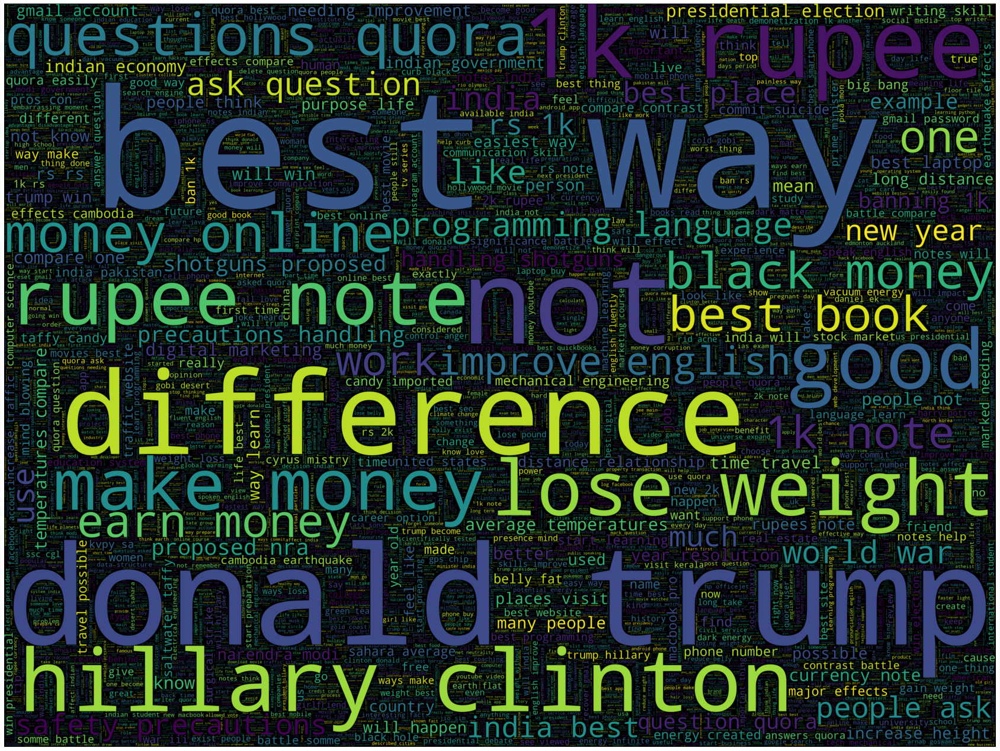

In [137]:
wc = WordCloud(background_color='black',
               max_words=len(train_textp_w),
               stopwords=stopwords,
               width=4000,
              height=3000)
wc.generate(train_textp_w)

print('Word Cloud for Duplicate Question pairs')
plt.figure(figsize=(30,40))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

#### *Word Clouds generated from non-duplicate pair question's text of TRAIN DATA*

Word Cloud for Duplicate Question pairs


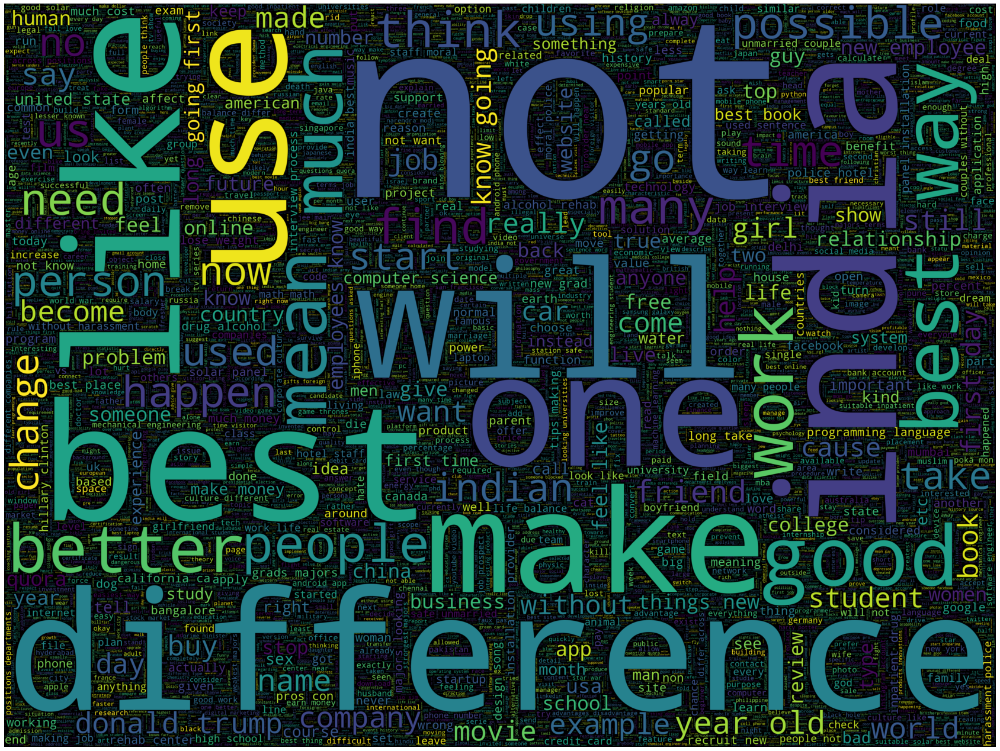

In [139]:
wc = WordCloud(background_color='black',
               max_words=len(train_textp_w),
               stopwords=stopwords,
               width=4000,
              height=3000)
wc.generate(train_textn_w)

print('Word Cloud for Duplicate Question pairs')
plt.figure(figsize=(30,40))
plt.imshow(wc, interpolation='bilinear')
plt.axis('off')
plt.show()

<h4> 3.5.1.2 Pair plot of features ['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'] </h4>

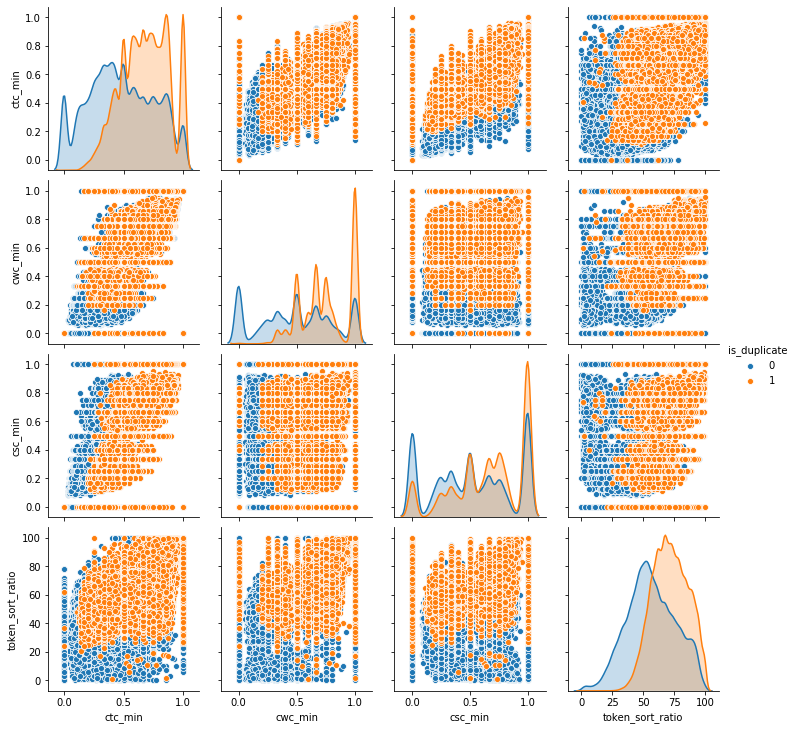

In [141]:
n = train_df_nlp.shape[0]
sns.pairplot(train_df_nlp[['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio', 'is_duplicate']][0:n], hue='is_duplicate', vars=['ctc_min', 'cwc_min', 'csc_min', 'token_sort_ratio'])
plt.show()

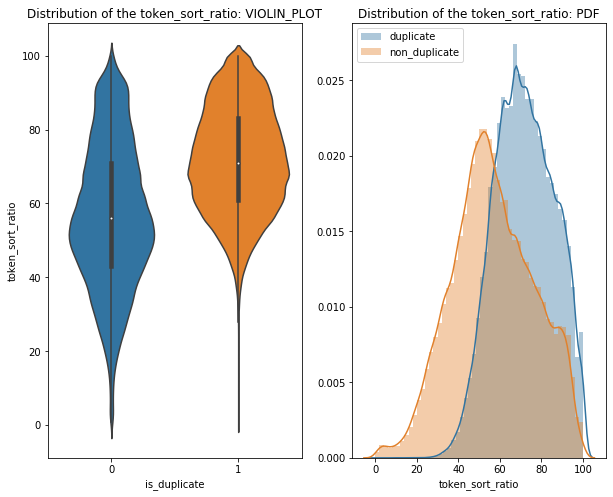

In [142]:
# Distribution of the token_sort_ratio of TRAIN_DATA

plt.figure(figsize=(10,8))
plt.subplot(1,2,1)
sns.violinplot(x='is_duplicate', y='token_sort_ratio', data=train_df_nlp[0:])
plt.title('Distribution of the token_sort_ratio: VIOLIN_PLOT')


plt.subplot(1,2,2)
sns.distplot(train_df_nlp[train_df_nlp['is_duplicate']== 1.0]['token_sort_ratio'][0:], label='duplicate', color='#3274A1')
sns.distplot(train_df_nlp[train_df_nlp['is_duplicate']== 0.0]['token_sort_ratio'][0:], label='non_duplicate', color='#E1812C')

plt.title('Distribution of the token_sort_ratio: PDF')
plt.legend()
plt.show()

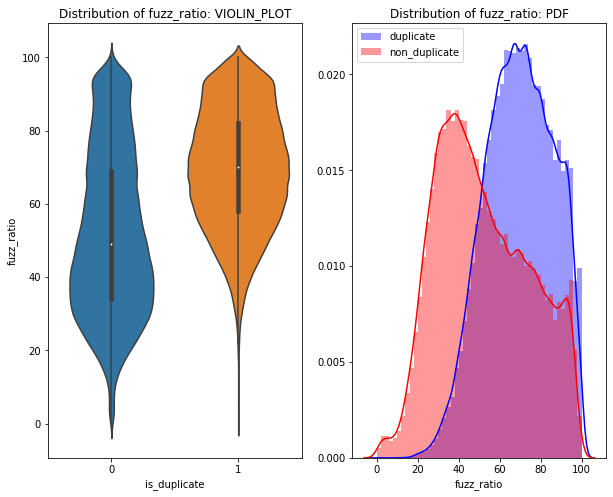

In [143]:
# Distribution of fuzz_ratio of TRAIN DATA 
plt.figure(figsize=(10,8))

plt.subplot(1,2,1)
sns.violinplot(x='is_duplicate', y='fuzz_ratio', data=train_df_nlp[0:])
plt.title('Distribution of fuzz_ratio: VIOLIN_PLOT')


plt.subplot(1,2,2)
sns.distplot(train_df_nlp[train_df_nlp['is_duplicate']== 1.0]['fuzz_ratio'][0:], label='duplicate', color='blue')
sns.distplot(train_df_nlp[train_df_nlp['is_duplicate']== 0.0]['fuzz_ratio'][0:], label='non_duplicate', color='red')

plt.title('Distribution of fuzz_ratio: PDF')
plt.legend()
plt.show()

In [144]:
# Using TSNE for Dimensionality reduction for 15 features(Generated after clening the data) to 3 dimension
from sklearn.preprocessing import MinMaxScaler

dfp_subsampled = train_df_nlp[0:5000]
X = MinMaxScaler().fit_transform(dfp_subsampled[['cwc_min',
                                                 'cwc_max',
                                                 'csc_min',
                                                 'csc_max' ,
                                                 'ctc_min' , 
                                                 'ctc_max' , 
                                                 'last_word_eq',
                                                 'first_word_eq' ,
                                                 'abs_len_diff' ,
                                                 'mean_len' , 
                                                 'token_set_ratio' , 
                                                 'token_sort_ratio' , 
                                                 'fuzz_ratio' ,
                                                 'fuzz_partial_ratio' ,
                                                 'longest_substr_ratio'
                                                ]])

y = dfp_subsampled['is_duplicate'].values

In [145]:
tsne2d = TSNE(
    n_components=2,
    init='random',
    random_state=42, # or '101', or anything you want
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.587s...
[t-SNE] Computed neighbors for 5000 samples in 2.682s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.137243
[t-SNE] Computed conditional probabilities in 2.468s
[t-SNE] Iteration 50: error = 81.7632370, gradient norm = 0.0455443 (50 iterations in 11.804s)
[t-SNE] Iteration 100: error = 70.8513031, gradient norm = 0.0107795 (50 iterations in 4.850s)
[t-SNE] Iteration 150: error = 69.0152664, gradient norm = 0.0052267 (50 iterations in 4.049s)
[t-SNE] Iteration 200: error = 68.2465973, gradient norm = 0.0039904 (50 iterations in 3.448s)
[t-SNE] Iteration 250: error = 67.8041763, gradient norm = 0.003781

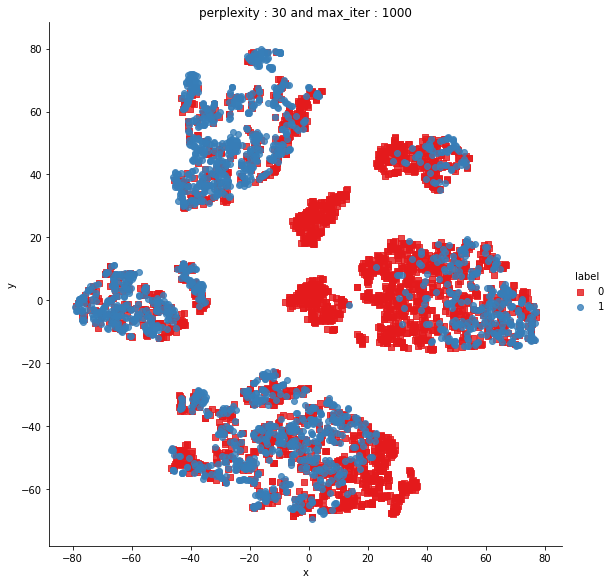

In [146]:
new_df = pd.DataFrame({'x':tsne2d[:,0], 'y':tsne2d[:,1] ,'label':y})

# draw the plot in appropriate place in the grid
sns.lmplot(data=new_df, x='x', y='y', hue='label', fit_reg=False, size=8,palette="Set1",markers=['s','o'])
plt.title("perplexity : {} and max_iter : {}".format(30, 1000))
plt.show()

In [147]:
from sklearn.manifold import TSNE
tsne3d = TSNE(
    n_components=3,
    init='random', # pca
    random_state=101,
    method='barnes_hut',
    n_iter=1000,
    verbose=2,
    angle=0.5
).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 5000 samples in 0.016s...
[t-SNE] Computed neighbors for 5000 samples in 0.729s...
[t-SNE] Computed conditional probabilities for sample 1000 / 5000
[t-SNE] Computed conditional probabilities for sample 2000 / 5000
[t-SNE] Computed conditional probabilities for sample 3000 / 5000
[t-SNE] Computed conditional probabilities for sample 4000 / 5000
[t-SNE] Computed conditional probabilities for sample 5000 / 5000
[t-SNE] Mean sigma: 0.137243
[t-SNE] Computed conditional probabilities in 1.710s
[t-SNE] Iteration 50: error = 81.9685135, gradient norm = 0.0321781 (50 iterations in 18.081s)
[t-SNE] Iteration 100: error = 69.8501282, gradient norm = 0.0033605 (50 iterations in 9.508s)
[t-SNE] Iteration 150: error = 68.4505310, gradient norm = 0.0018830 (50 iterations in 8.344s)
[t-SNE] Iteration 200: error = 67.8204041, gradient norm = 0.0011860 (50 iterations in 8.183s)
[t-SNE] Iteration 250: error = 67.4677429, gradient norm = 0.001270

In [149]:
trace1 = go.Scatter3d(
    x=tsne3d[:,0],
    y=tsne3d[:,1],
    z=tsne3d[:,2],
    mode='markers',
    marker=dict(
        sizemode='diameter',
        color = y,
        colorscale = 'Portland',
        colorbar = dict(title = 'duplicate'),
        line=dict(color='rgb(255, 255, 255)'),
        opacity=0.75
    )
)

data=[trace1]
layout=dict(height=800, width=800, title='3d embedding with engineered features')
fig=dict(data=data, layout=layout)
py.iplot(fig, filename='3DBubble')

<hr>
<hr>
<p style="font-family:'Segoe UI'; font-size:20px; color:red">From now, Below is complete isolated notebook's code</p>
<hr>
<hr>

## 3.6 Featurizing text data with tfidf 

In [199]:
# avoid decoding problems
train_df = pd.read_csv("train_df.csv")
 
# encode questions to unicode
# https://stackoverflow.com/a/6812069
# ----------------- python 2 ---------------------
# df['question1'] = df['question1'].apply(lambda x: unicode(str(x),"utf-8"))
# df['question2'] = df['question2'].apply(lambda x: unicode(str(x),"utf-8"))
# ----------------- python 3 ---------------------
train_df['question1'] = train_df['question1'].apply(lambda x: str(x))
train_df['question2'] = train_df['question2'].apply(lambda x: str(x))

In [200]:
train_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate
0,8067,15738,15739,How do I play Pokémon GO in Korea?,How do I play Pokémon GO in China?,0
1,368101,12736,104117,What are some of the best side dishes for crab...,What are some good side dishes for buffalo chi...,0


In [201]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
# merge texts
questions = list(train_df['question1']) + list(train_df['question2'])

tfidf = TfidfVectorizer(lowercase=False, )
tfidf.fit_transform(questions)

# dict key:word and value:tf-idf score
# this helps to find avg w2v
word2tfidf = dict(zip(tfidf.get_feature_names(), tfidf.idf_))

- After we find TF-IDF scores, we convert each question to a weighted average of word2vec vectors by these score.
- here we use a pre-trained GLOVE model which comes free with "Spacy". https://spacy.io/usage/vectors-similarity.
- It is trained on Wikipedia and therefore, it is stronger in terms of word semantics.

In [202]:
#### TRAIN DATA ################

# IT WILL TAKE QUITE A LONG TIME
# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

vecs1 = []
# https://github.com/noamraph/tqdm
# tqdm is used to print the progress bar
for qu1 in tqdm(list(train_df['question1'])):
    doc1 = nlp(qu1) 
    # 96 is the number of dimensions of vectors 
    mean_vec1 = np.zeros([len(doc1), len(doc1[0].vector)])
    for word1 in doc1:
        # word2vec
        vec1 = word1.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word1)]
        except:
            idf = 0
        # compute final vec
        mean_vec1 += vec1 * idf
    mean_vec1 = mean_vec1.mean(axis=0)
    vecs1.append(mean_vec1)
train_df['q1_feats_m'] = list(vecs1)


100%|████████████████████████████████████████████████████████████████████████| 283003/283003 [1:36:38<00:00, 48.81it/s]


In [203]:
#########          TRAIN DATA   ###################

# IT WILL TAKE QUITE A LONG TIME
vecs2 = []
for qu2 in tqdm(list(train_df['question2'])):
    doc2 = nlp(qu2) 
    mean_vec2 = np.zeros([len(doc2), len(doc2[0].vector)])
    for word2 in doc2:
        # word2vec
        vec2 = word2.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word2)]
        except:
            #print word
            idf = 0
        # compute final vec
        mean_vec2 += vec2 * idf
    mean_vec2 = mean_vec2.mean(axis=0)
    vecs2.append(mean_vec2)
train_df['q2_feats_m'] = list(vecs2)

100%|████████████████████████████████████████████████████████████████████████| 283003/283003 [1:22:47<00:00, 56.97it/s]


In [204]:
train_df.to_csv('train_df_tfidf.csv', index=False)

In [205]:
train_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_feats_m,q2_feats_m
0,8067,15738,15739,How do I play Pokémon GO in Korea?,How do I play Pokémon GO in China?,0,"[47.35728734731674, 1.2781131267547607, -34.21...","[51.797711968421936, 10.592990636825562, -40.4..."
1,368101,12736,104117,What are some of the best side dishes for crab...,What are some good side dishes for buffalo chi...,0,"[-39.48335003852844, -1.3051723912358284, -26....","[-21.470731794834137, 13.933188393712044, -39...."


#### Featurizing text data of TEST DATA using Already fitted by TRAIN DATA

In [206]:
# avoid decoding problems
test_df = pd.read_csv("test_df.csv")
 
# encode questions to unicode
# https://stackoverflow.com/a/6812069
# ----------------- python 2 ---------------------
# df['question1'] = df['question1'].apply(lambda x: unicode(str(x),"utf-8"))
# df['question2'] = df['question2'].apply(lambda x: unicode(str(x),"utf-8"))
# ----------------- python 3 ---------------------
test_df['question1'] = test_df['question1'].apply(lambda x: str(x))
test_df['question2'] = test_df['question2'].apply(lambda x: str(x))

In [207]:
#### TEST DATA ################

# IT WILL TAKE  QUITE A LONG TIME
# en_vectors_web_lg, which includes over 1 million unique vectors.
nlp = spacy.load('en_core_web_sm')

vecs1_test = []
# https://github.com/noamraph/tqdm
# tqdm is used to print the progress bar
for qu1 in tqdm(list(test_df['question1'])):
    doc1 = nlp(qu1) 
    # 96 is the number of dimensions of vectors 
    mean_vec1 = np.zeros([len(doc1), len(doc1[0].vector)])
    for word1 in doc1:
        # word2vec
        vec1 = word1.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word1)]
        except:
            idf = 0
        # compute final vec
        mean_vec1 += vec1 * idf
    mean_vec1 = mean_vec1.mean(axis=0)
    vecs1_test.append(mean_vec1)
test_df['q1_feats_m'] = list(vecs1_test)


100%|██████████████████████████████████████████████████████████████████████████| 121287/121287 [33:54<00:00, 59.62it/s]


In [208]:
#########          TEST DATA   ###################

# IT WILL TAKE QUITE A LONG TIME
vecs2_test = []
for qu2 in tqdm(list(test_df['question2'])):
    doc2 = nlp(qu2) 
    mean_vec2 = np.zeros([len(doc2), len(doc2[0].vector)])
    for word2 in doc2:
        # word2vec
        vec2 = word2.vector
        # fetch df score
        try:
            idf = word2tfidf[str(word2)]
        except:
            #print word
            idf = 0
        # compute final vec
        mean_vec2 += vec2 * idf
    mean_vec2 = mean_vec2.mean(axis=0)
    vecs2_test.append(mean_vec2)
df['q2_feats_m'] = list(vecs2_test)

100%|██████████████████████████████████████████████████████████████████████████| 121287/121287 [36:20<00:00, 55.62it/s]


ValueError: Length of values does not match length of index

In [210]:
test_df['q2_feats_m'] = list(vecs2_test)

In [211]:
test_df.to_csv('test_df_tfidf.csv', index=False)

In [212]:
test_df.head(2)

,id,qid1,qid2,question1,question2,is_duplicate,q1_feats_m,q2_feats_m
0,3,7,8,Why am I mentally very lonely? How can I solve...,Find the remainder when [math]23^{24}[/math] i...,0,"[57.907325744628906, -22.190625846385956, -4.5...","[41.28806355595589, 57.144173353910446, 31.313..."
1,5,11,12,Astrology: I am a Capricorn Sun Cap moon and c...,"I'm a triple Capricorn (Sun, Moon and ascendan...",1,"[49.850769996643066, 25.6095073223114, -79.427...","[75.55207294970751, -18.694724252447486, -6.67..."


In [213]:
############## TRAIN DATA ##########################

#prepro_features_train.csv (Simple Preprocessing Feartures)
#nlp_features_train.csv (NLP Features)
if os.path.isfile('nlp_features_train_data.csv'):
    dfnlp_train = pd.read_csv("nlp_features_train_data.csv",encoding='latin-1')
else:
    print("download nlp_features_train_data.csv from drive or run previous notebook")

if os.path.isfile('df_fe_without_preprocessing_train_data.csv'):
    dfppro_train = pd.read_csv("df_fe_without_preprocessing_train_data.csv",encoding='latin-1')
else:
    print("download df_fe_without_preprocessing_train_data.csv from drive or run previous notebook")

In [214]:
###################### TRAIN DATA #######################

df1_tr = dfnlp_train.drop(['qid1','qid2','question1','question2'],axis=1)
df2_tr = dfppro_train.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)
df3_tr = train_df.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)
df3_q1_tr = pd.DataFrame(df3_tr.q1_feats_m.values.tolist(), index= df3_tr.index)
df3_q2_tr = pd.DataFrame(df3_tr.q2_feats_m.values.tolist(), index= df3_tr.index)

In [215]:
############## TEST DATA ##########################

#prepro_features_train.csv (Simple Preprocessing Feartures)
#nlp_features_train.csv (NLP Features)
if os.path.isfile('nlp_features_test_data.csv'):
    dfnlp_test = pd.read_csv("nlp_features_test_data.csv",encoding='latin-1')
else:
    print("download nlp_features_test_data.csv from drive or run previous notebook")

if os.path.isfile('df_fe_without_preprocessing_test_data.csv'):
    dfppro_test = pd.read_csv("df_fe_without_preprocessing_test_data.csv",encoding='latin-1')
else:
    print("download df_fe_without_preprocessing_test_data.csv from drive or run previous notebook")

In [216]:
###################### TEST DATA #######################

df1_te = dfnlp_test.drop(['qid1','qid2','question1','question2'],axis=1)
df2_te = dfppro_test.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)
df3_te = test_df.drop(['qid1','qid2','question1','question2','is_duplicate'],axis=1)
df3_q1_te = pd.DataFrame(df3_te.q1_feats_m.values.tolist(), index= df3_te.index)
df3_q2_te = pd.DataFrame(df3_te.q2_feats_m.values.tolist(), index= df3_te.index)

**TRAINING DATA**

In [217]:
# data of nlp features
df1_tr.head(1)

,id,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,8067,0,0.749981,0.749981,0.999975,0.999975,0.874989,0.874989,0.0,1.0,0.0,8.0,90,81,88,88,0.8


In [218]:
# data before preprocessing
df2_tr.head(1)

,id,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,8067,2,2,35,35,8,8,7.0,0.4375,4,0


In [219]:
# Question 1 tfidf weighted word2vec
df3_q1_tr.head(1)

,0,1,2,3,4,5,6,7,8,9,...,86,87,88,89,90,91,92,93,94,95
0,47.357287,1.278113,-34.219464,-9.556497,23.46679,127.073945,-30.231845,44.92297,186.341811,106.192763,...,-17.371935,-63.755992,-36.67723,6.686258,-44.474672,-20.178519,-42.563334,92.075903,6.281437,50.075979


In [220]:
# Question 2 tfidf weighted word2vec
df3_q2_tr.head(2)

,0,1,2,3,4,5,6,7,8,9,...,86,87,88,89,90,91,92,93,94,95
0,51.797712,10.592991,-40.468687,-7.913447,17.610006,126.804690,-35.784997,25.234137,164.802151,101.130334,...,1.340843,-54.059437,-43.409046,12.299125,-47.568606,-23.771868,-47.370493,70.831976,-5.086517,46.778854
1,-21.470732,13.933188,-39.271960,32.059055,94.150803,45.959969,9.817485,14.336948,73.952174,67.911857,...,-19.114233,4.585785,-20.052024,22.891366,-22.449025,-29.232060,42.082743,48.005050,47.698746,64.582401


In [221]:
print("Number of features in nlp dataframe :", df1_tr.shape[1])
print("Number of features in preprocessed dataframe :", df2_tr.shape[1])
print("Number of features in question1 w2v  dataframe :", df3_q1_tr.shape[1])
print("Number of features in question2 w2v  dataframe :", df3_q2_tr.shape[1])
print("Number of features in final dataframe  :", df1_tr.shape[1]+df2_tr.shape[1]+df3_q1_tr.shape[1]+df3_q2_tr.shape[1])

Number of features in nlp dataframe : 17
Number of features in preprocessed dataframe : 11
Number of features in question1 w2v  dataframe : 96
Number of features in question2 w2v  dataframe : 96
Number of features in final dataframe  : 220


**TEST DATA**

In [222]:
df1_te.head(1)

,id,is_duplicate,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,token_set_ratio,token_sort_ratio,fuzz_ratio,fuzz_partial_ratio,longest_substr_ratio
0,3,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,12.0,28,24,9,14,0.039216


In [223]:
df2_te.head(1)

,id,freq_qid1,freq_qid2,q1len,q2len,q1_n_words,q2_n_words,word_Common,word_share,freq_q1+q2,freq_q1-q2
0,3,1,1,50,65,11,9,0.0,0.0,2,0


In [224]:
df3_q1_te.head(1)

,0,1,2,3,4,5,6,7,8,9,...,86,87,88,89,90,91,92,93,94,95
0,57.907326,-22.190626,-4.543988,-88.888149,-4.655223,-54.364467,74.804678,106.606396,15.444968,38.95727,...,28.49511,41.991089,-11.072324,16.802424,-36.338249,8.938278,-64.453016,95.192205,-34.096271,71.059616


In [225]:
df3_q2_te.head(1)

,0,1,2,3,4,5,6,7,8,9,...,86,87,88,89,90,91,92,93,94,95
0,41.288064,57.144173,31.313895,-5.352266,33.213021,79.86834,15.68741,39.677476,21.509846,102.669119,...,-17.909459,30.437944,49.40475,27.740728,25.889231,-32.00852,-3.841615,-13.876309,5.274399,7.505472


In [226]:
print("Number of features in nlp dataframe :", df1_te.shape[1])
print("Number of features in preprocessed dataframe :", df2_te.shape[1])
print("Number of features in question1 w2v  dataframe :", df3_q1_te.shape[1])
print("Number of features in question2 w2v  dataframe :", df3_q2_te.shape[1])
print("Number of features in final dataframe  :", df1_te.shape[1]+df2_te.shape[1]+df3_q1_te.shape[1]+df3_q2_te.shape[1])

Number of features in nlp dataframe : 17
Number of features in preprocessed dataframe : 11
Number of features in question1 w2v  dataframe : 96
Number of features in question2 w2v  dataframe : 96
Number of features in final dataframe  : 220


In [238]:
################ TRAIN DATA ###########################
# storing the final features to csv file
if not os.path.isfile('final_features_train.csv'):
    df3_q1_tr['id']=df1_tr['id']
    df3_q2_tr['id']=df1_tr['id']
    df1_tr  = df1_tr.merge(df2_tr, on='id',how='left')
    df2_tr  = df3_q1_tr.merge(df3_q2_tr, on='id',how='left')
    result  = df1_tr.merge(df2_tr, on='id',how='left')
    result.to_csv('final_features_train.csv',index=False)

In [239]:
################ TEST DATA ###########################

# storing the final features to csv file
if not os.path.isfile('final_features_test.csv'):
    df3_q1_te['id']=df1_te['id']
    df3_q2_te['id']=df1_te['id']
    df1_te  = df1_te.merge(df2_te, on='id',how='left')
    df2_te  = df3_q1_te.merge(df3_q2_te, on='id',how='left')
    result  = df1_te.merge(df2_te, on='id',how='left')
    result.to_csv('final_features_test.csv',index=False)

<hr>
<hr>
<hr>

<h1 style="font-family:'Segoe UI';color:Blue" id='section4'>4. Machine Learning Modeling</h1>

<h3 style="font-family:'Segoe UI';color:green">importing libraries</h3>

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import sqlite3
from sqlalchemy import create_engine # database connection
import csv
import os
warnings.filterwarnings("ignore")
import datetime as dt
import numpy as np
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from collections import Counter
from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.model_selection import StratifiedKFold 
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier



from sklearn.model_selection import cross_val_score
from sklearn.linear_model import SGDClassifier
from mlxtend.classifier import StackingClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import precision_recall_curve, auc, roc_curve

In [2]:
train_data = pd.read_csv('final_features_train.csv')

In [3]:
test_data = pd.read_csv('final_features_test.csv')

In [4]:
X_train = train_data.drop('is_duplicate', axis=1)
y_train = train_data['is_duplicate']

In [5]:
X_train.head(1)

,Unnamed: 0,id,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,...,86_y,87_y,88_y,89_y,90_y,91_y,92_y,93_y,94_y,95_y
0,0,8067,0.749981,0.749981,0.999975,0.999975,0.874989,0.874989,0.0,1.0,...,1.340843,-54.059437,-43.409046,12.299125,-47.568606,-23.771868,-47.370493,70.831976,-5.086517,46.778854


In [6]:
y_train.head(1)

0    0
Name: is_duplicate, dtype: int64

In [7]:
X_test = test_data.drop('is_duplicate', axis=1)
y_test = test_data['is_duplicate']

In [8]:
X_test.head(1)

,Unnamed: 0,id,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,...,86_y,87_y,88_y,89_y,90_y,91_y,92_y,93_y,94_y,95_y
0,0,3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-17.909459,30.437944,49.40475,27.740728,25.889231,-32.00852,-3.841615,-13.876309,5.274399,7.505472


In [9]:
y_test.head(1)

0    0
Name: is_duplicate, dtype: int64

In [10]:
# dropping unnecessary col
X_train.drop(['Unnamed: 0','id'], axis=1, inplace=True)
X_test.drop(['Unnamed: 0', 'id'], axis=1, inplace=True)

In [11]:
X_train.head(1)

,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,...,86_y,87_y,88_y,89_y,90_y,91_y,92_y,93_y,94_y,95_y
0,0.749981,0.749981,0.999975,0.999975,0.874989,0.874989,0.0,1.0,0.0,8.0,...,1.340843,-54.059437,-43.409046,12.299125,-47.568606,-23.771868,-47.370493,70.831976,-5.086517,46.778854


In [12]:
X_test.head(1)

,cwc_min,cwc_max,csc_min,csc_max,ctc_min,ctc_max,last_word_eq,first_word_eq,abs_len_diff,mean_len,...,86_y,87_y,88_y,89_y,90_y,91_y,92_y,93_y,94_y,95_y
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,12.0,...,-17.909459,30.437944,49.40475,27.740728,25.889231,-32.00852,-3.841615,-13.876309,5.274399,7.505472


In [13]:
print("Number of data points in train data : ", X_train.shape)
print("Number of data points in test data : ", X_test.shape)

Number of data points in train data :  (283003, 217)
Number of data points in test data :  (121287, 217)


In [14]:
print("="*10,"Distribution of output variable in train data","="*10)
train_distr = Counter(y_train)
train_len = len(y_train)
print("Class 0: ", int(train_distr[0])/(train_len),
      "Class 1: ", int(train_distr[1])/(train_len) )

print("="*10, "Distribution of output variable in test data","="*10)
test_distr = Counter(y_test)
test_len = len(y_test)
print("Class 0: ", int(test_distr[0])/test_len,
      "Class 1: ", int(test_distr[1])/test_len )

========== Distribution of output variable in train data ==========
Class 0:  0.6303325406444454 Class 1:  0.36966745935555456
========== Distribution of output variable in test data ==========
Class 0:  0.6318978950753172 Class 1:  0.36810210492468276


In [15]:
# https://medium.com/@dtuk81/confusion-matrix-visualization-fc31e3f30fea
def plot_matrix(conf_matrix):
    '''This function plot the given 2x2 matrix'''
    sns.set(font_scale=1.0)
    group_names = ['True Neg','False Pos','False Neg','True Pos']
    group_counts = ["{0:0.0f}".format(value) for value in conf_matrix.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in conf_matrix.flatten()/np.sum(conf_matrix)]
    labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in zip(group_names,group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    sns.heatmap(conf_matrix, annot=labels, fmt="",cmap='Blues', yticklabels=0, xticklabels=0, linewidth=0.1, linecolor='red')


# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    print("A:",A)
    #divid each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    print('B:',B)
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
#     labels = [1,2]
    # representing A in heatmap format
#     cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    plot_matrix(C)
#     sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    plot_matrix(B)
#     sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
#     sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plot_matrix(A)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

<h2 style="font-family:'Segoe UI';color:Green">Building a random model (Finding worst-case log-loss)

In [16]:
# we need to generate 9 numbers and the sum of numbers should be 1
# one solution is to genarate 9 numbers and divide each of the numbers by their sum
# ref: https://stackoverflow.com/a/18662466/4084039
# we create a output array that has exactly same size as the CV data
predicted_y = np.zeros((test_len,2))
for i in range(test_len):
    rand_probs = np.random.rand(1,2)
    predicted_y[i] = ((rand_probs/sum(sum(rand_probs)))[0])

print("Log loss on Test Data using Random Model", log_loss(y_test,predicted_y, eps=1e-15))



Log loss on Test Data using Random Model 0.8868271995222123


In [17]:
predicted_y = np.argmax(predicted_y, axis=1)

In [18]:
predicted_y

array([1, 0, 1, ..., 1, 1, 1], dtype=int64)

In [19]:
y_test

0         0
1         1
2         1
3         0
4         1
         ..
121282    0
121283    0
121284    1
121285    0
121286    1
Name: is_duplicate, Length: 121287, dtype: int64

A: [[0.49811459 0.50188541]
 [0.4985665  0.5014335 ]]
B: [[0.63168694 0.63210741]
 [0.36831306 0.36789259]]


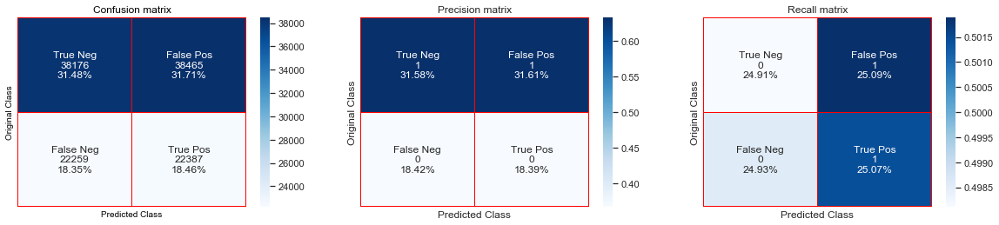

In [20]:
plot_confusion_matrix(y_test,predicted_y)

<h2 style="font-family:'Segoe UI';color:Blue">LogisticRegression() using SGDClassifier</h2>

In [266]:
alpha = [10 ** x for x in range(-5,2)] # hyperparameter for SGD Classifier

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------

log_error_array = []
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(X_train,y_train)
    sig_clf = CalibratedClassifierCV(clf, method='sigmoid')
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test,predict_y, labels=clf.classes_,eps=1e-15))
    print('For values of alpha = ', i, ' The log loss is: ', log_loss(y_test,predict_y, labels=clf.classes_, eps=1e-15))
    

For values of alpha =  1e-05  The log loss is:  0.4960541637407015
For values of alpha =  0.0001  The log loss is:  0.5028003152264032
For values of alpha =  0.001  The log loss is:  0.4974186962191928
For values of alpha =  0.01  The log loss is:  0.4953663610018281
For values of alpha =  0.1  The log loss is:  0.5105210854236737
For values of alpha =  1  The log loss is:  0.5208817068837236
For values of alpha =  10  The log loss is:  0.5544849558276095


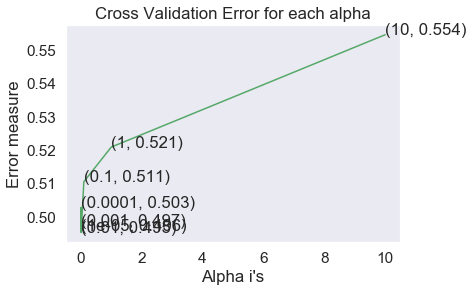

In [267]:
fig, ax = plt.subplots()
ax.plot(alpha, log_error_array, c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i], np.round(txt,3)), (alpha[i], log_error_array[i]))

plt.grid()
plt.title('Cross Validation Error for each alpha')
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()

For values of best alpha =  0.01 The train log loss is: 0.45456462031856654
For values of best alpha =  0.01 The test log loss is: 0.4953663610018281
Total number of data points : 121287
A: [[0.92042118 0.07957882]
 [0.58562917 0.41437083]]
B: [[0.72958382 0.24793691]
 [0.27041618 0.75206309]]


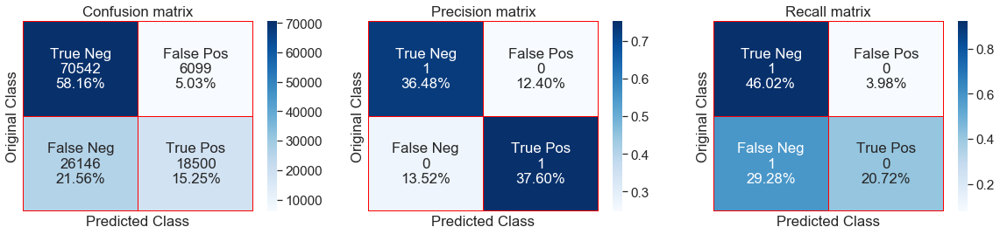

In [268]:
best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l2', loss='log', random_state=42)
clf.fit(X_train,y_train)
sig_clf = CalibratedClassifierCV(clf, method='sigmoid')
sig_clf.fit(X_train,y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h2 style="font-family:'Segoe UI';color:Blue">Linear SVM with hyperparameter tuning</h2>

For values of alpha =  1e-05 The log loss is: 0.6579431368107588
For values of alpha =  0.0001 The log loss is: 0.6579431368107588
For values of alpha =  0.001 The log loss is: 0.5681379923471537
For values of alpha =  0.01 The log loss is: 0.5266122180589635
For values of alpha =  0.1 The log loss is: 0.6020875319575145
For values of alpha =  1 The log loss is: 0.637502049301394
For values of alpha =  10 The log loss is: 0.6565769249652967


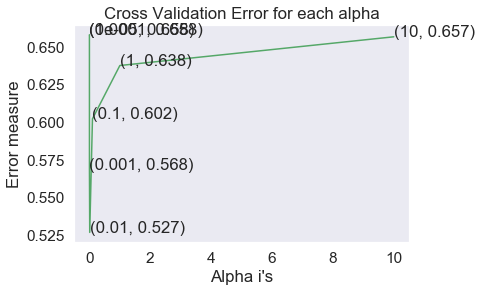

In [ ]:
alpha = [10 ** x for x in range(-5, 2)] # hyperparam for SGD classifier.

# read more about SGDClassifier() at http://scikit-learn.org/stable/modules/generated/sklearn.linear_model.SGDClassifier.html
# ------------------------------
# default parameters
# SGDClassifier(loss=’hinge’, penalty=’l2’, alpha=0.0001, l1_ratio=0.15, fit_intercept=True, max_iter=None, tol=None, 
# shuffle=True, verbose=0, epsilon=0.1, n_jobs=1, random_state=None, learning_rate=’optimal’, eta0=0.0, power_t=0.5, 
# class_weight=None, warm_start=False, average=False, n_iter=None)

# some of methods
# fit(X, y[, coef_init, intercept_init, …])	Fit linear model with Stochastic Gradient Descent.
# predict(X)	Predict class labels for samples in X.

#-------------------------------
# video link: 
#------------------------------


log_error_array=[]
for i in alpha:
    clf = SGDClassifier(alpha=i, penalty='l1', loss='hinge', random_state=42)
    clf.fit(X_train, y_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(X_train, y_train)
    predict_y = sig_clf.predict_proba(X_test)
    log_error_array.append(log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
    print('For values of alpha = ', i, "The log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))

fig, ax = plt.subplots()
ax.plot(alpha, log_error_array,c='g')
for i, txt in enumerate(np.round(log_error_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],log_error_array[i]))
plt.grid()
plt.title("Cross Validation Error for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Error measure")
plt.show()


best_alpha = np.argmin(log_error_array)
clf = SGDClassifier(alpha=alpha[best_alpha], penalty='l1', loss='hinge', random_state=42)
clf.fit(X_train, y_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(X_train, y_train)

predict_y = sig_clf.predict_proba(X_train)
print('For values of best alpha = ', alpha[best_alpha], "The train log loss is:",log_loss(y_train, predict_y, labels=clf.classes_, eps=1e-15))
predict_y = sig_clf.predict_proba(X_test)
print('For values of best alpha = ', alpha[best_alpha], "The test log loss is:",log_loss(y_test, predict_y, labels=clf.classes_, eps=1e-15))
predicted_y =np.argmax(predict_y,axis=1)
print("Total number of data points :", len(predicted_y))
plot_confusion_matrix(y_test, predicted_y)

<h2 style="font-family:'Segoe UI'; color:Blue">XGBoost</h2>

In [22]:
import xgboost as xgb
params = {}
params['objective'] = 'binary:logistic'
params['eval_metric'] = 'logloss'
params['eta'] = 0.02
params['max_depth'] = 4

d_train = xgb.DMatrix(X_train, label=y_train)
d_test = xgb.DMatrix(X_test, label=y_test)

watchlist = [(d_train, 'train'), (d_test, 'valid')]

bst = xgb.train(params, d_train, 400, watchlist, early_stopping_rounds=50, verbose_eval=10)

xgdmat = xgb.DMatrix(X_train,y_train)
predict_y = bst.predict(d_test)
print("The test log loss is:",log_loss(y_test, predict_y,  eps=1e-15)) # labels=clf.classes_,

KeyboardInterrupt: 